In [1]:
import json
import logging
import time
from pathlib import Path
import json
import os
from pdf2image import convert_from_path
import numpy as np
from PIL import ImageDraw, ImageFont
import matplotlib.pyplot as plt

In [2]:
from docling.backend.pypdfium2_backend import PyPdfiumDocumentBackend
from docling.datamodel.base_models import InputFormat
from docling.datamodel.pipeline_options import (
    AcceleratorDevice,
    AcceleratorOptions,
    PdfPipelineOptions,
)
from docling.document_converter import DocumentConverter, PdfFormatOption
from docling.models.ocr_mac_model import OcrMacOptions
from docling.models.tesseract_ocr_cli_model import TesseractCliOcrOptions
from docling.models.tesseract_ocr_model import TesseractOcrOptions
from docling.datamodel.document import DoclingDocument

In [76]:
input_doc_path = Path("./sample1.pdf")

In [77]:
%%time
pipeline_options = PdfPipelineOptions(generate_page_images=True, images_scale=2.0)
pipeline_options.accelerator_options = AcceleratorOptions(AcceleratorDevice.AUTO, num_threads=4)

converter = DocumentConverter(format_options={
    InputFormat.PDF : PdfFormatOption(pipeline_options=pipeline_options)
})
result = converter.convert(input_doc_path)

CPU times: user 15 s, sys: 726 ms, total: 15.7 s
Wall time: 14.4 s


In [78]:
result_doc = result.document

In [79]:
json_file_path = Path(f"./{os.path.basename(input_doc_path)[:-4]}.json")
json_file_path

PosixPath('sample1.json')

In [80]:
result_doc.save_as_json(json_file_path)

## Load the saved json

In [81]:
result_doc_1 = DoclingDocument.load_from_json(json_file_path)
pages = result_doc_1.pages

## One element annotation

In [9]:
extraction_element_no = 1
prov = result_doc_1.texts[extraction_element_no].prov[0]

In [62]:
page = pages[prov.page_no]
bbox = prov.bbox.to_top_left_origin(page_height=page.size.height)
bbox = bbox.normalized(page.size)

img = page.image.pil_image.copy()
thickness = 2
padding = thickness + 2
bbox.l = round(bbox.l * img.width - padding)
bbox.r = round(bbox.r * img.width + padding)
bbox.t = round(bbox.t * img.height - padding)
bbox.b = round(bbox.b * img.height + padding)
draw = ImageDraw.Draw(img)
draw.rectangle(
    xy=bbox.as_tuple(),
    outline="blue",
    width=thickness,
)

In [63]:
font = ImageFont.truetype("../fonts/arial/arial.ttf", 20)
text = "Top Label"

text_bbox = draw.textbbox(xy = (5, 15), text=text, font=font)
text_len = text_bbox[2] - text_bbox[0]
text_ht = text_bbox[3] - text_bbox[1]

text_l = int((bbox.l + bbox.r - text_len)/2)
text_t = bbox.t - text_ht - thickness
print(f"text_l: {text_l} text_t: {text_t}")
draw.text(xy = (text_l, text_t), text = text, font = font, fill="red")

text_l: 575 text_t: 125


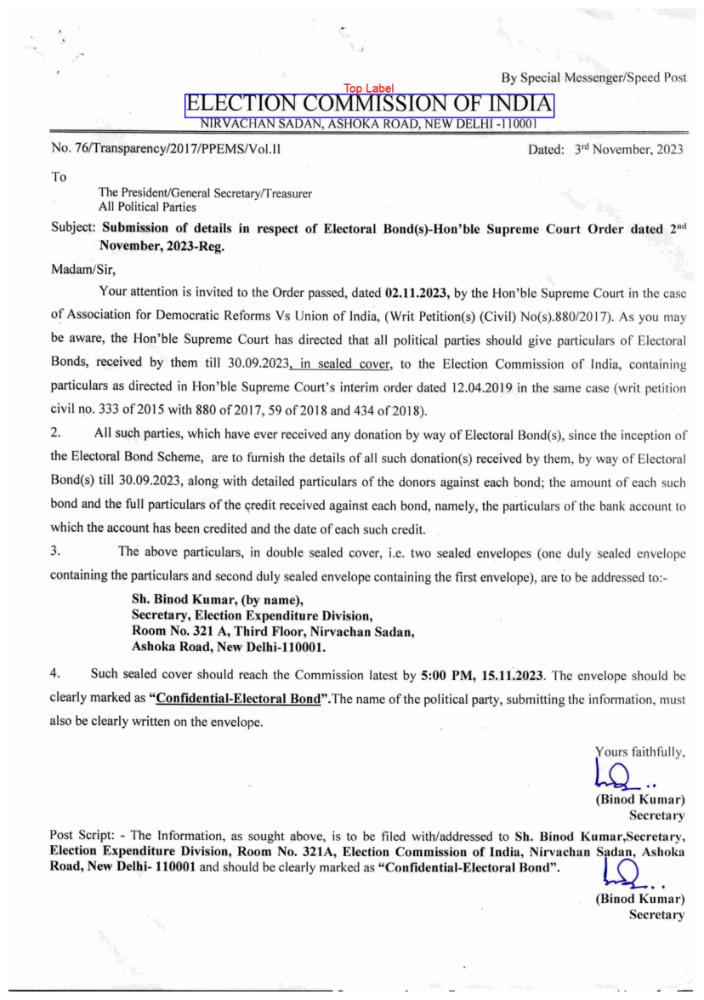

In [64]:
plt.figure(figsize=[15, 15])
plt.imshow(img)
plt.axis("off")
plt.show()

## Multi element annotation

In [83]:
extraction_element_numbers = range(len(result_doc_1.texts))
extraction_element_numbers

range(0, 311)

In [84]:
extraction_element_numbers = range(len(result_doc_1.texts))
all_images_dict = {i : pages[i].image.pil_image.copy() for i in pages}
thickness = 2
font = ImageFont.truetype("../fonts/arial/arial.ttf", 20)

for extraction_element_no in extraction_element_numbers:
    prov = result_doc_1.texts[extraction_element_no].prov[0]

    page = pages[prov.page_no]
    img = all_images_dict[prov.page_no]
    bbox = prov.bbox.to_top_left_origin(page_height=page.size.height)
    bbox = bbox.normalized(page.size)

    padding = thickness + 2
    bbox.l = round(bbox.l * img.width - padding)
    bbox.r = round(bbox.r * img.width + padding)
    bbox.t = round(bbox.t * img.height - padding)
    bbox.b = round(bbox.b * img.height + padding)
    draw = ImageDraw.Draw(img)
    draw.rectangle(
        xy=bbox.as_tuple(),
        outline="blue",
        width=thickness,
    )

    # Annotating the rectangle
    text = f"E {extraction_element_no}"
    text_bbox = draw.textbbox(xy = (5, 15), text=text, font=font)
    text_len = text_bbox[2] - text_bbox[0]
    text_ht = text_bbox[3] - text_bbox[1]

    text_l = int((bbox.l + bbox.r - text_len)/2)
    text_t = bbox.t - text_ht - thickness
    # print(f"text_l: {text_l} text_t: {text_t}")
    draw.text(xy = (text_l, text_t), text = text, font = font, fill="red")

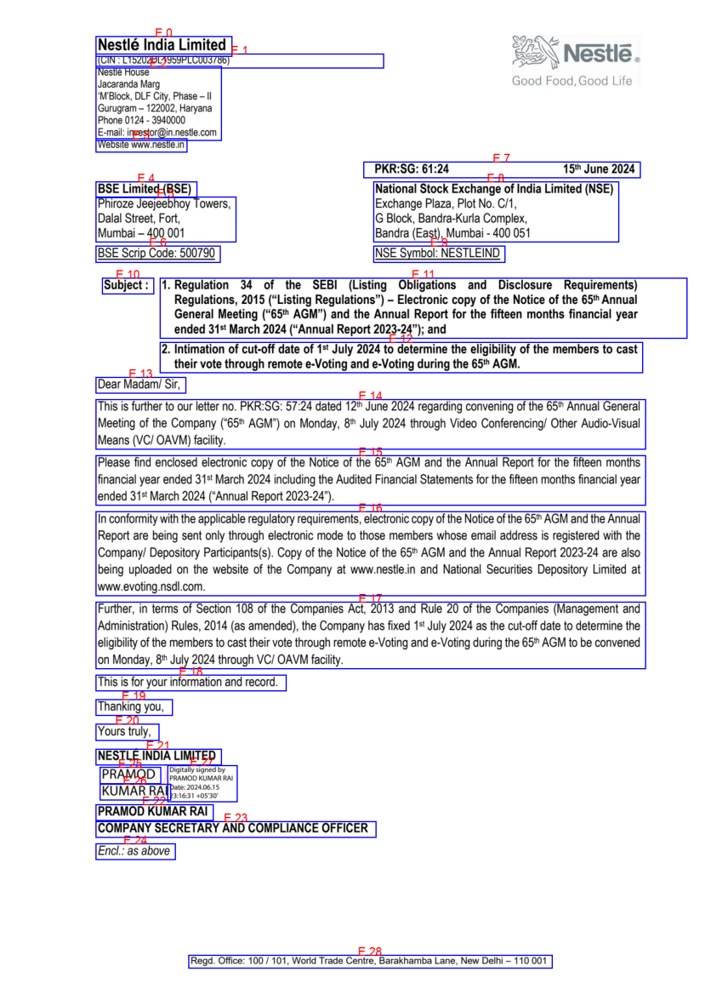

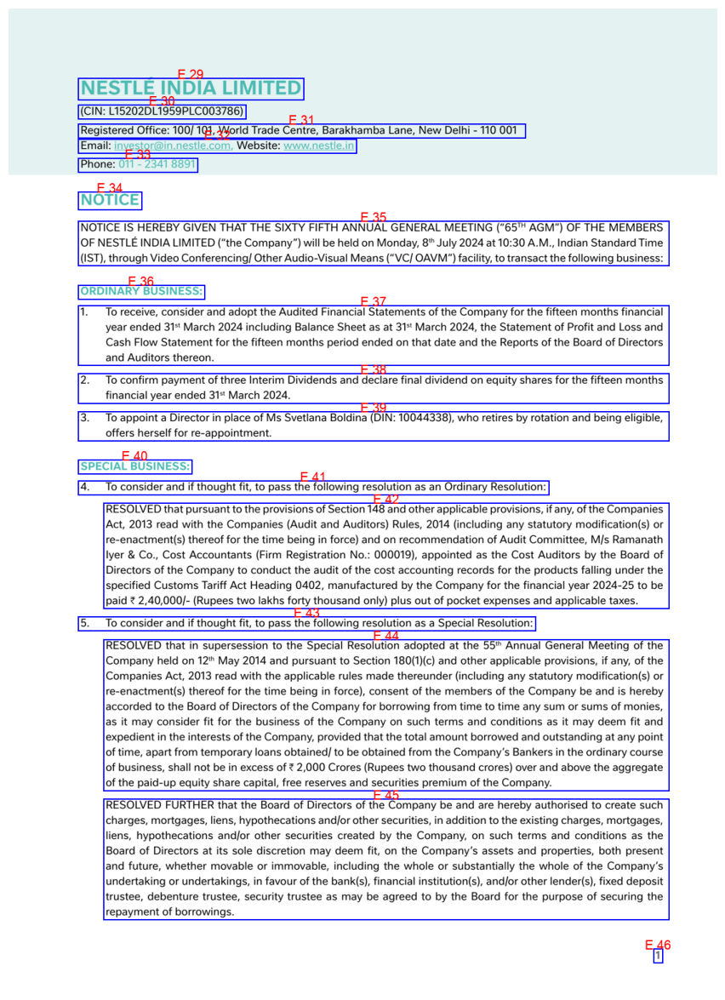

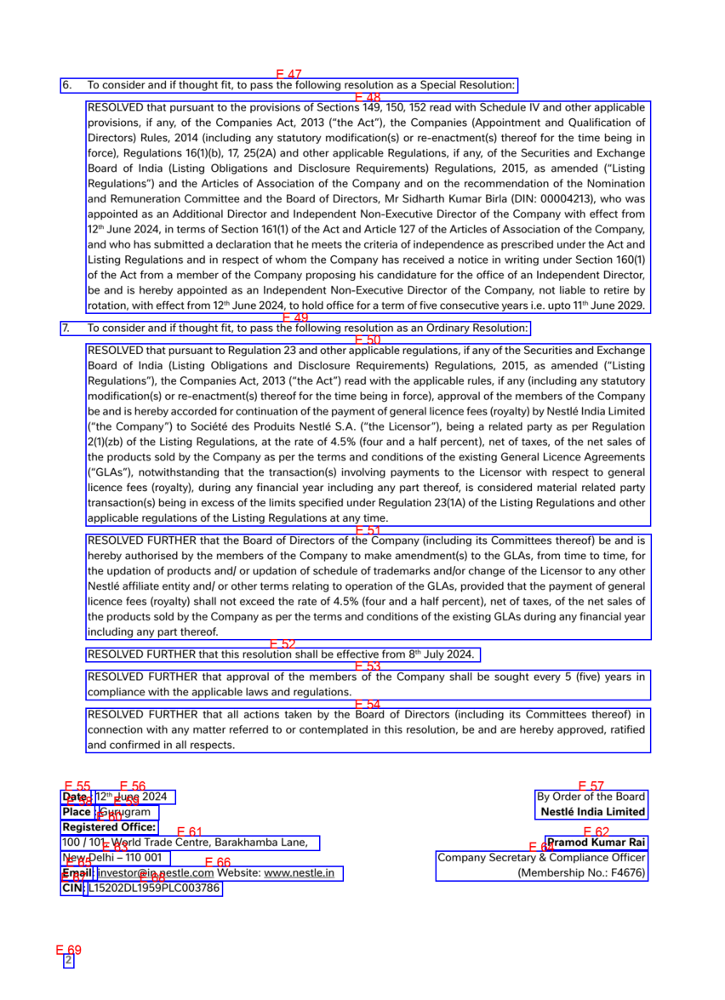

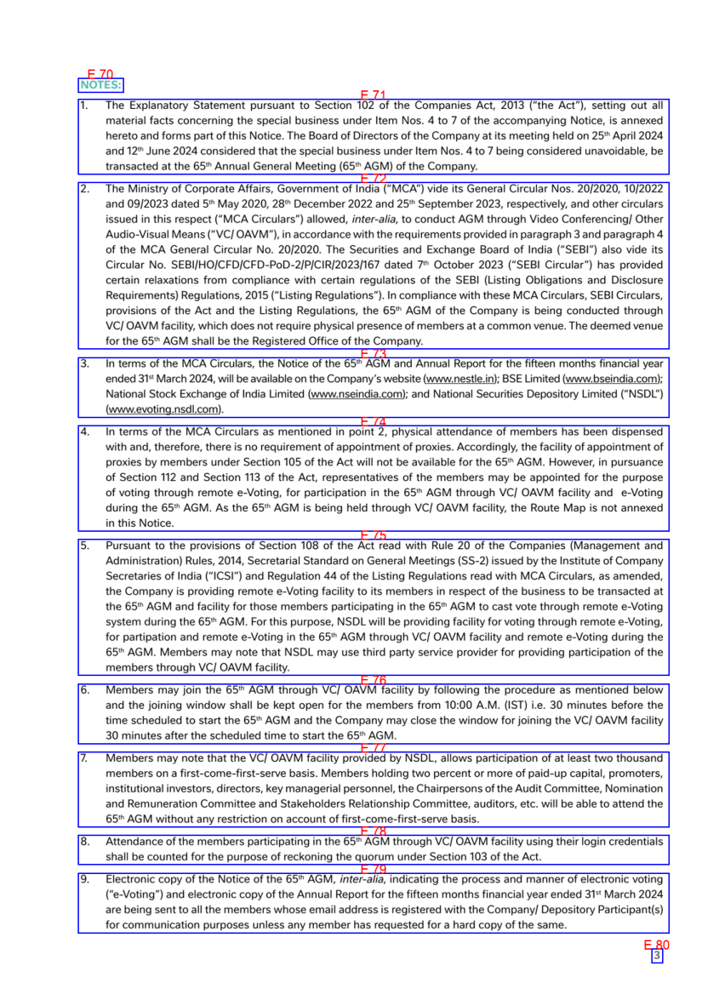

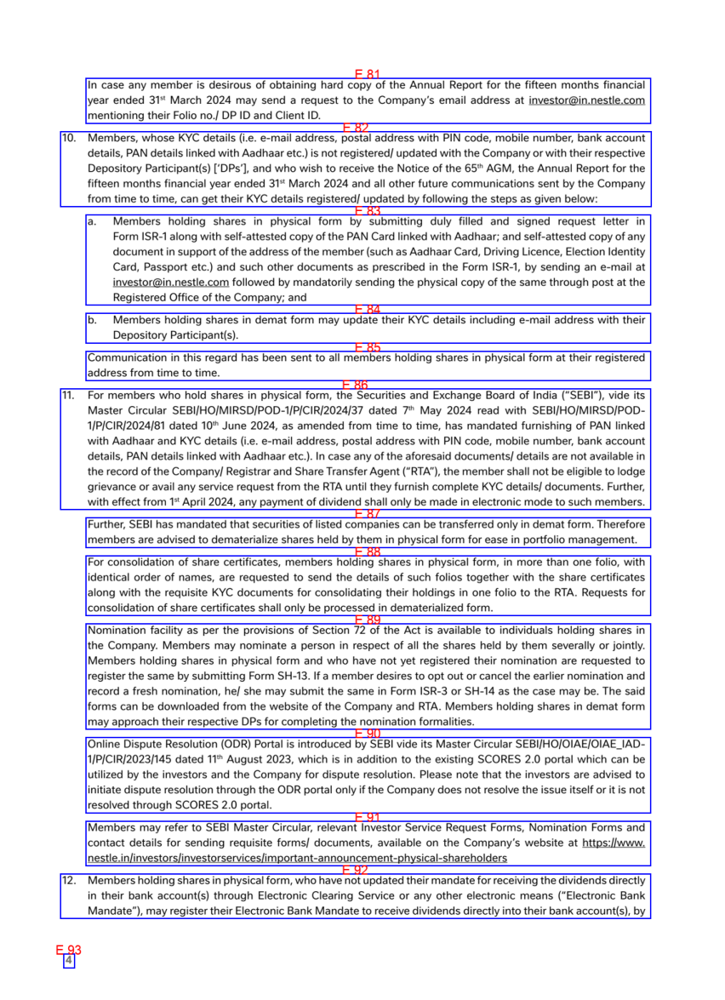

...

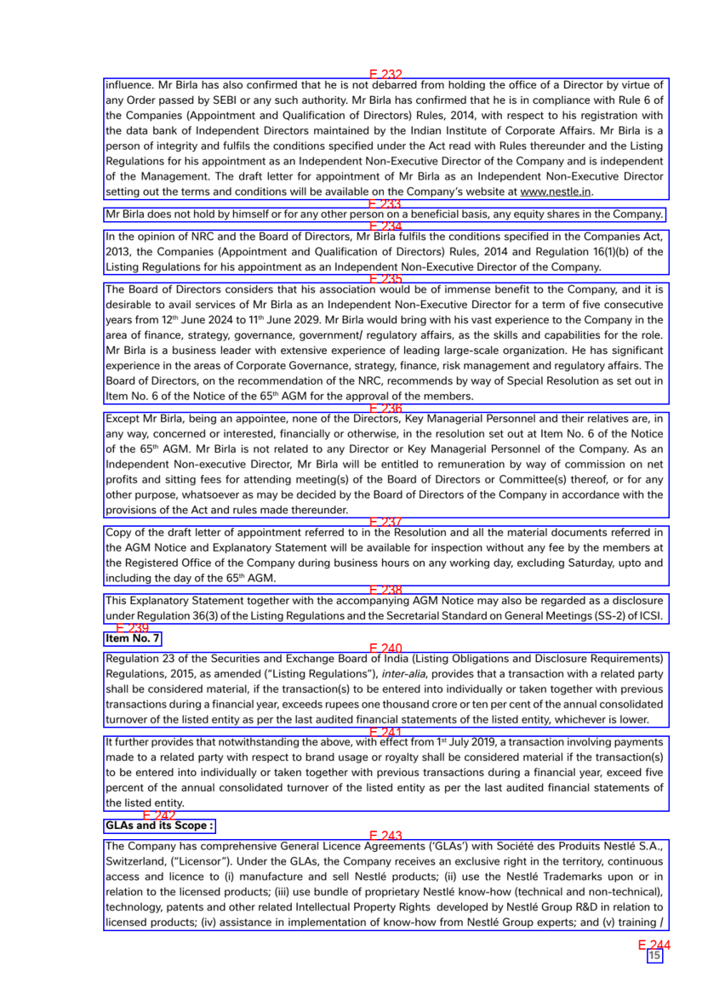

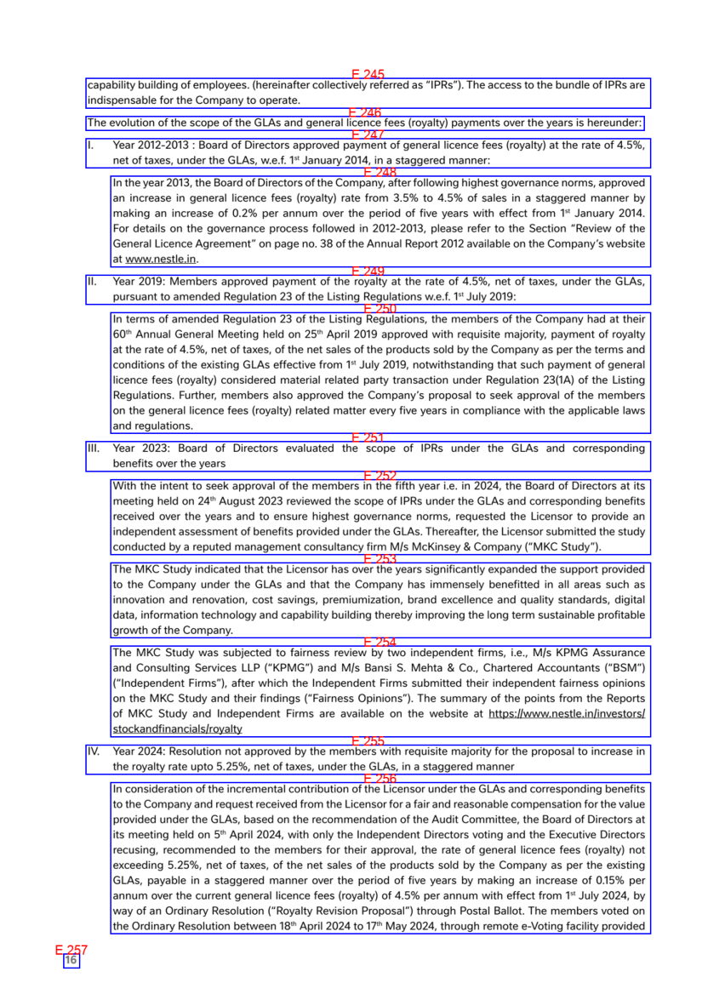

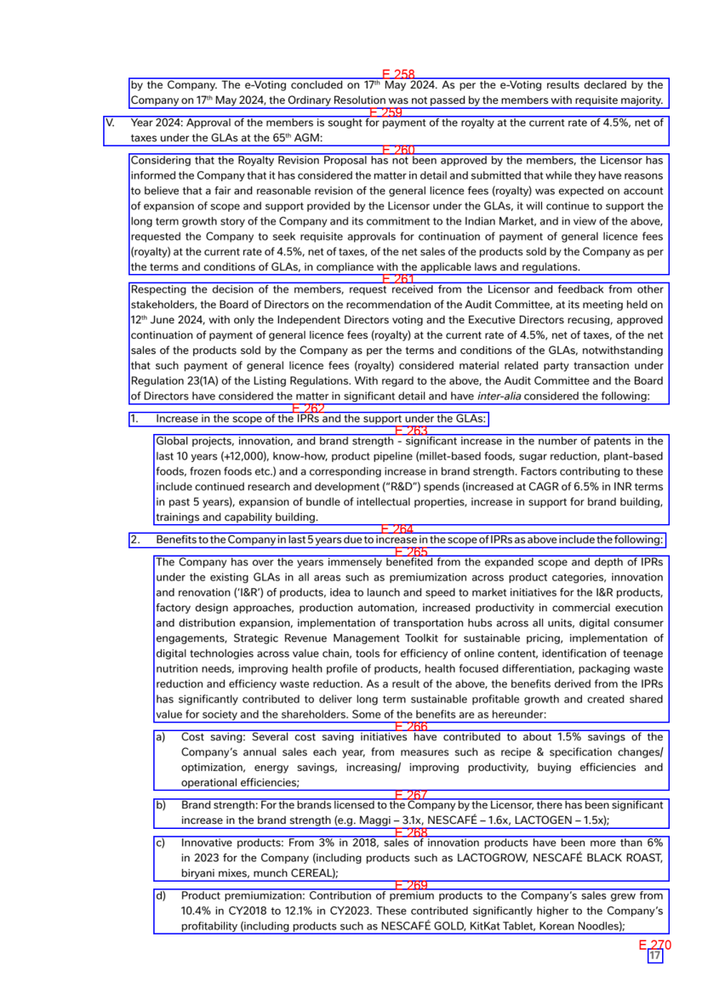

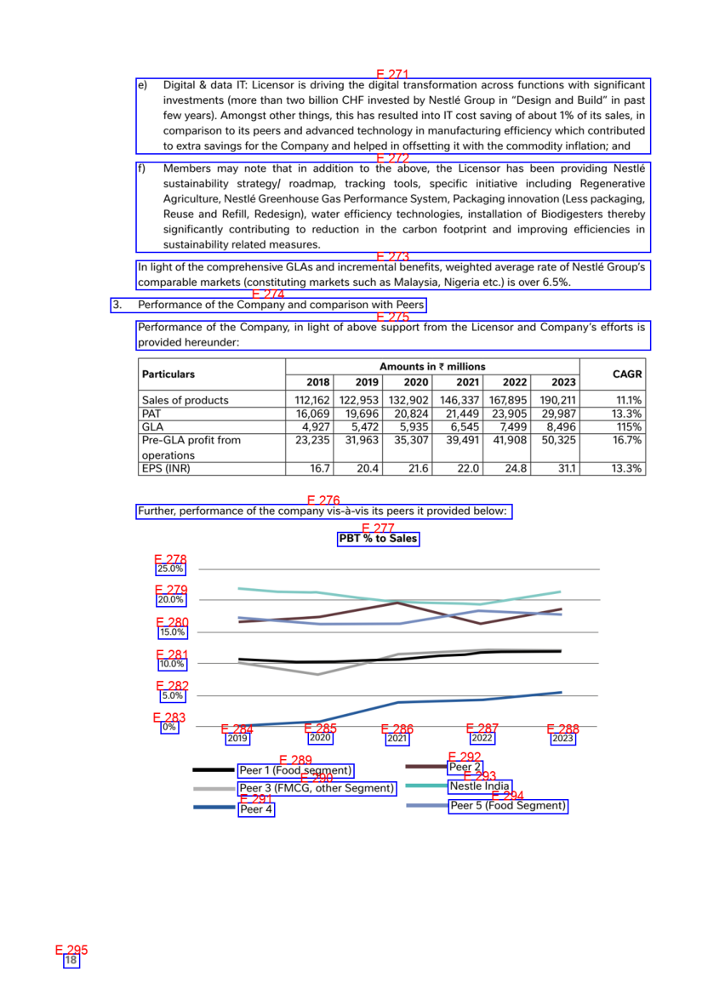

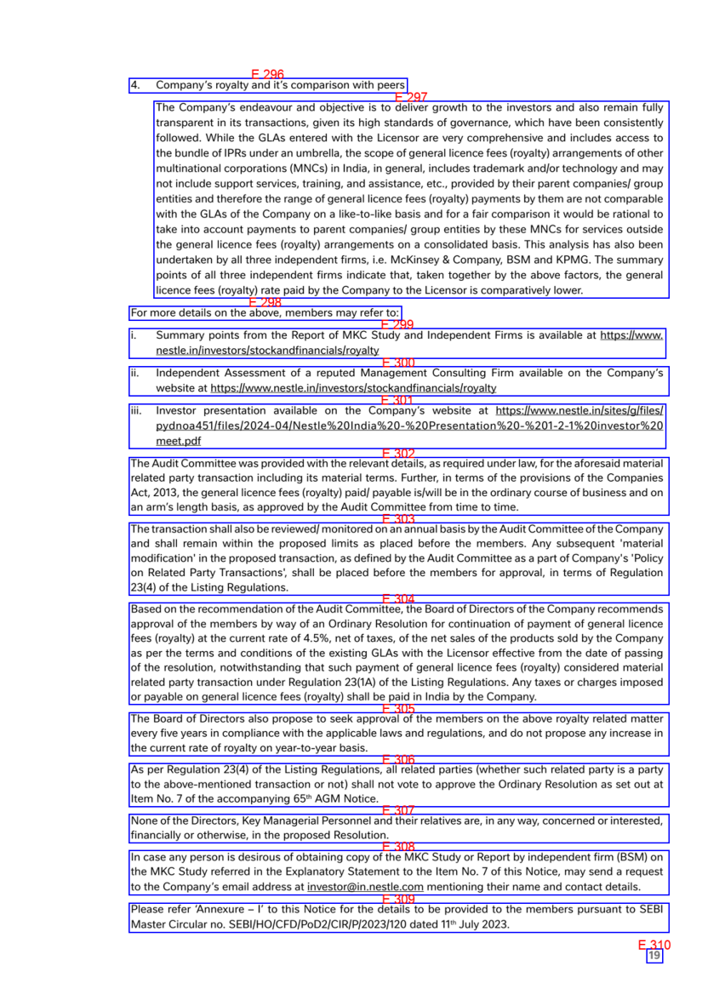

In [86]:
for page_no in all_images_dict:
    plt.figure(figsize=[15, 15])
    plt.imshow(all_images_dict[page_no])
    plt.axis("off")
    plt.show()